In [1]:
import os
# os.environ['http_proxy'] = 'http://10.16.35.10:13390' 
# os.environ['https_proxy'] = 'http://10.16.35.10:13390' 
os.environ["CUDA_VISIBLE_DEVICES"] = "2" 
# os.environ['PATH'] += os.pathsep + '/usr/local/texlive/2023/bin/x86_64-linux'

import torch
from torch import nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import open_clip
from matplotlib.font_manager import FontProperties

import sys
from diffusion_prior import *
from custom_pipeline import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import open_clip

image_encoder, preprocess_train, feature_extractor = open_clip.create_model_and_transforms(
    'ViT-H-14', pretrained='laion2b_s32b_b79k', precision='fp16', device=device)

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import clip
from torch.nn import functional as F
import torch.nn as nn
from torchvision import transforms
from PIL import Image
train = False
classes = None
pictures= None
config_path = "data_config.json"
import json
with open(config_path, "r") as config_file:
    config = json.load(config_file)
data_path = config["data_path"]
features_path = config["features_path"]
img_directory_training = config["img_directory_training"]
img_directory_test = config["img_directory_test"]

from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

# processor = BlipProcessor.from_pretrained("/home/geek/Workspace/BCI/Code/Decoding/BLIP/blip-image-captioning-base")
# model = BlipForConditionalGeneration.from_pretrained("/home/geek/Workspace/BCI/Code/Decoding/BLIP/blip-image-captioning-base", torch_dtype=torch.float16).to("cuda")
def load_data():
    data_list = []
    label_list = []
    texts = []
    images = []
    blip_texts = []
    if train:
        text_directory = img_directory_training
    else:
        text_directory = img_directory_test
    # 获取该路径下的所有目录
    dirnames = [d for d in os.listdir(text_directory) if os.path.isdir(os.path.join(text_directory, d))]
    dirnames.sort()
    
    if classes is not None:
        dirnames = [dirnames[i] for i in classes]

    for dir in dirnames:
        # 尝试找到第一个'_'的位置
        try:
            idx = dir.index('_')
            description = dir[idx+1:]  # 从第一个'_'之后取得所有内容
        except ValueError:
            print(f"Skipped: {dir} due to no '_' found.")
            continue
            
        new_description = f"{description}"
        texts.append(new_description)

    if train:
        img_directory = img_directory_training
    else:
        img_directory =img_directory_test
    
    all_folders = [d for d in os.listdir(img_directory) if os.path.isdir(os.path.join(img_directory, d))]
    all_folders.sort()  # 保证文件夹的顺序

    if classes is not None and pictures is not None:
        images = []  # 初始化images列表
        for i in range(len(classes)):
            class_idx = classes[i]
            pic_idx = pictures[i]
            if class_idx < len(all_folders):
                folder = all_folders[class_idx]
                folder_path = os.path.join(img_directory, folder)
                all_images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
                all_images.sort()
                if pic_idx < len(all_images):
                    images.append(os.path.join(folder_path, all_images[pic_idx]))                                                        

    elif classes is not None and pictures is None:
        images = []  # 初始化images列表
        for i in range(len(classes)):
            class_idx = classes[i]
            if class_idx < len(all_folders):
                folder = all_folders[class_idx]
                folder_path = os.path.join(img_directory, folder)
                all_images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
                all_images.sort()
                images.extend(os.path.join(folder_path, img) for img in all_images)
                
    elif classes is None:
        images = []  # 初始化images列表
        for idx, folder in enumerate(all_folders):
            folder_path = os.path.join(img_directory, folder)
            all_images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
            all_images.sort()  
            images.extend(os.path.join(folder_path, img) for img in all_images)
            raw_image = Image.open(os.path.join(folder_path, all_images[0])).convert("RGB")
            # print(raw_image)
            # conditional image captioning
            text = [i.join(" ") for i in texts[idx].split("_")]
            # inputs = processor(raw_image, text, return_tensors="pt").to("cuda", torch.float16)

            # out = model.generate(**inputs)
            # blip_text = processor.decode(out[0], skip_special_tokens=True)
            # print(blip_text)
            # blip_texts.append(blip_text)
    else:
        # 处理其他情况，比如 classes 和 pictures 长度不匹配
        print("Error")
    return texts, blip_texts, images
texts, blip_texts, images = load_data()
# texts[3]
# images.shape
# blip_texts

Load eeg and image embeddings

In [2]:
# # load image embeddings
# data = torch.load('/home/ldy/Workspace/THINGS/CLIP/ViT-H-14_features_test.pt', map_location='cuda:3')
# emb_img_test = data['img_features']

# # load image embeddings
# data = torch.load('/home/ldy/Workspace/THINGS/CLIP/ViT-H-14_features_train.pt', map_location='cuda:3')
# emb_img_train = data['img_features']

In [4]:
emb_img_test = torch.load('variables/ViT-H-14_features_test.pt')
emb_img_train = torch.load('variables/ViT-H-14_features_train.pt')

# torch.save(emb_img_test.cpu().detach(), 'variables/ViT-H-14_features_test.pt')
# torch.save(emb_img_train.cpu().detach(), 'variables/ViT-H-14_features_train.pt')

In [5]:
emb_img_test.shape, emb_img_train.shape

(torch.Size([200, 1024]), torch.Size([16540, 1024]))

In [6]:
# 1654clsx10imgsx4trials=66160
emb_eeg = torch.load('/home/ldy/Workspace/Reconstruction/ATM_S_eeg_features_sub-08.pt')

emb_eeg_test = torch.load('/home/ldy/Workspace/Reconstruction/ATM_S_eeg_features_sub-08_test.pt')

In [7]:
emb_eeg.shape, emb_eeg_test.shape

(torch.Size([200, 1024]), torch.Size([200, 1024]))

Training prior diffusion

In [7]:

class EmbeddingDataset(Dataset):

    def __init__(self, c_embeddings=None, h_embeddings=None, h_embeds_uncond=None, cond_sampling_rate=0.5):
        self.c_embeddings = c_embeddings
        self.h_embeddings = h_embeddings
        self.N_cond = 0 if self.h_embeddings is None else len(self.h_embeddings)
        self.h_embeds_uncond = h_embeds_uncond
        self.N_uncond = 0 if self.h_embeds_uncond is None else len(self.h_embeds_uncond)
        self.cond_sampling_rate = cond_sampling_rate

    def __len__(self):
        return self.N_cond

    def __getitem__(self, idx):
        return {
            "c_embedding": self.c_embeddings[idx],
            "h_embedding": self.h_embeddings[idx]
        }


In [8]:
emb_img_train_4 = emb_img_train.view(1654,10,1,1024).repeat(1,1,4,1).view(-1,1024)

In [9]:
emb_img_train_4.shape

torch.Size([66160, 1024])

In [10]:
# path_data = '/mnt/dataset0/weichen/projects/visobj/proposals/mise/data'
# image_features = torch.load(os.path.join(path_data, 'openclip_emb/emb_imgnet.pt')) # 'emb_imgnet' or 'image_features'
# h_embeds_imgnet = image_features['image_features']

In [11]:
from torch.utils.data import DataLoader
dataset = EmbeddingDataset(
    c_embeddings=emb_eeg, h_embeddings=emb_img_train_4, 
    # h_embeds_uncond=h_embeds_imgnet
)
print(len(dataset))
dataloader = DataLoader(dataset, batch_size=1024, shuffle=True, num_workers=64)

66160


In [12]:
# diffusion_prior = DiffusionPrior(dropout=0.1)
diffusion_prior = DiffusionPriorUNet(cond_dim=1024, dropout=0.1)
# number of parameters
print(sum(p.numel() for p in diffusion_prior.parameters() if p.requires_grad))
pipe = Pipe(diffusion_prior, device='cuda')

9675648


In [13]:
# load pretrained model
model_name = 'diffusion_prior' # 'diffusion_prior_vice_pre_imagenet' or 'diffusion_prior_vice_pre'
pipe.diffusion_prior.load_state_dict(torch.load(f'./ckpts/{model_name}.pt'))
# pipe.train(dataloader, num_epochs=150, learning_rate=1e-3) # to 0.142 

<All keys matched successfully>

In [14]:
# save model
# torch.save(pipe.diffusion_prior.state_dict(), f'./ckpts/{model_name}.pt')

Generating by eeg embeddings

In [15]:
from IPython.display import Image, display
generator = Generator4Embeds(num_inference_steps=4, device=device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

image_embeds torch.Size([1, 1024])


  0%|          | 0/4 [00:00<?, ?it/s]

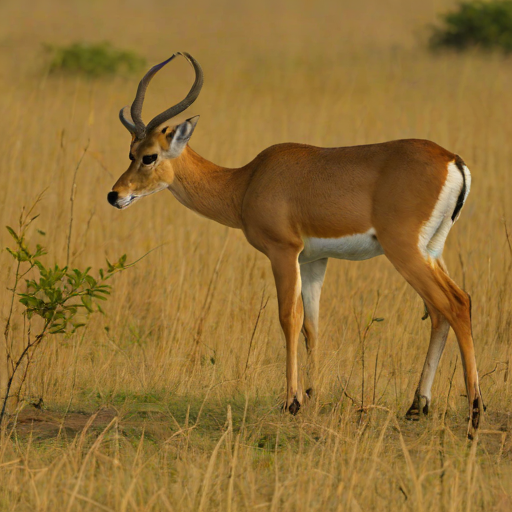

In [16]:
# path of ground truth: /home/ldy/Workspace/THINGS/images_set/test_images
k = 1
image_embeds = emb_img_test[k:k+1]
print("image_embeds", image_embeds.shape)
image = generator.generate(image_embeds)
display(image)

In [17]:
# image_embeds = emb_eeg_test[k:k+1]
# print("image_embeds", image_embeds.shape)
# image = generator.generate(image_embeds)
# display(image)

Generating by eeg informed image embeddings

image_embeds torch.Size([1, 1024])


50it [00:00, 289.63it/s]


  0%|          | 0/4 [00:00<?, ?it/s]

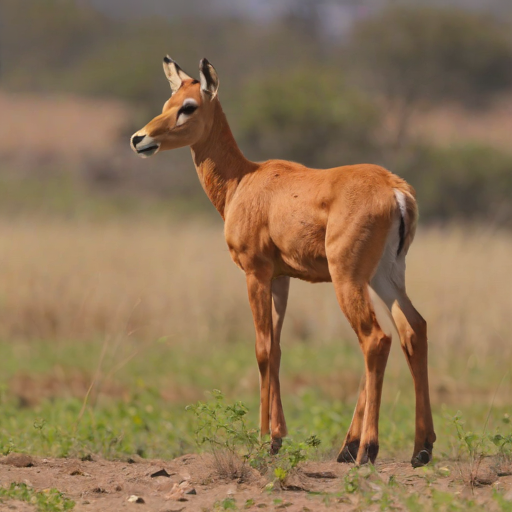

In [24]:
# k = 0
eeg_embeds = emb_eeg_test[k:k+1]
print("image_embeds", eeg_embeds.shape)
h = pipe.generate(c_embeds=eeg_embeds, num_inference_steps=50, guidance_scale=5.0)
image = generator.generate(h.to(dtype=torch.float16))
display(image)

In [53]:
from PIL import Image
import numpy as np
# Step 1: Randomly select 100 indices
sub = 10
selected_indices = np.random.choice(len(emb_eeg_test), 100, replace=False).tolist()

# Initialize lists to store results
avg_similarities = []
# 获取'generated'文件夹下所有子文件夹，并按字母顺序排序
generated_folders = sorted([d for d in os.listdir(f'./generated_imgs/sub-{sub}') if os.path.isdir(os.path.join(f'./generated_imgs/sub-{sub}', d))])


def preprocess(image):
    transform = transforms.Compose([
        transforms.ToTensor(),  # 将图像转换为 PyTorch 张量
        # 如果需要其他转换，比如缩放或标准化，可以在这里添加
    ])
    return transform(image)

# Step 2 and 3: Generate images and compute similarities
for idx in selected_indices:
    eeg_embed = emb_eeg_test[idx:idx+1]
    # Load and preprocess the original image
    original_image = Image.open(images[idx])
    original_image_preprocessed = preprocess_train(original_image).unsqueeze(0).to(device).to(torch.float16)
    # Extract CLIP embeddings for the original image
    original_clip_embed = image_encoder.encode_image(original_image_preprocessed)
    similarities = []
    generated_images_preprocessed = []

    for i in range(10):
        # 根据idx选择字母顺序的文件夹
        selected_folder = generated_folders[idx]

        # 构建图片的完整路径
        generated_image_path = os.path.join(f'./generated_imgs/sub-{sub}', selected_folder, f'{i}.png')
        generated_image = Image.open(generated_image_path)

        generated_image_preprocessed = preprocess_train(generated_image).unsqueeze(0).to(device).to(torch.float16)

        # Extract CLIP embeddings for the generated image
        generated_clip_embed = image_encoder.encode_image(generated_image_preprocessed)

        # Compute similarity
        similarity = F.cosine_similarity(original_clip_embed, generated_clip_embed)
        similarities.append(similarity.item())
        generated_images_preprocessed.append(preprocess(generated_image))

    # Step 5: Select representative image
    avg_similarity = np.mean(similarities)
    avg_similarities.append(avg_similarity)

# Step 6: Find images based on similarity criteria
overall_all_similarity = np.mean(avg_similarities)
top_12 = np.argsort(avg_similarities)[-12:]
middle_12 = np.argsort(abs(np.array(avg_similarities) - overall_all_similarity))[:12]
bottom_12 = np.argsort(avg_similarities)[:12]

In [55]:
# Function to visualize images
def visualize_images(image_indices, generated_folders,sub=sub):
    plt.figure(figsize=(36, 33))  # 12 images, 2 rows
    plt.subplots_adjust(wspace=0.01, hspace=0.01)

    for i, idx in enumerate(image_indices):
        # Find the corresponding original index

        # Show original image
        plt.subplot(11, 12, i + 1)
        original_image = Image.open(images[selected_indices[idx]])
        plt.imshow(original_image)
        plt.axis('off')

        # Show 10 generated image
        selected_folder = generated_folders[selected_indices[idx]]
        for j in range(1):
            generated_image_path = os.path.join(f'./generated_imgs/sub-{sub}', selected_folder, f'{j}.png')
            plt.subplot(11, 12, i + (j+1)*12+1)
            generated_image = Image.open(generated_image_path)
            plt.imshow(generated_image)
            plt.axis('off')

    plt.show()

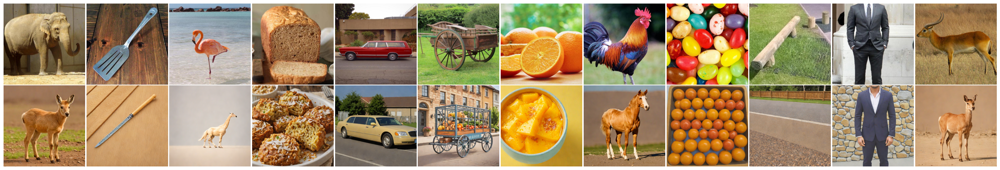

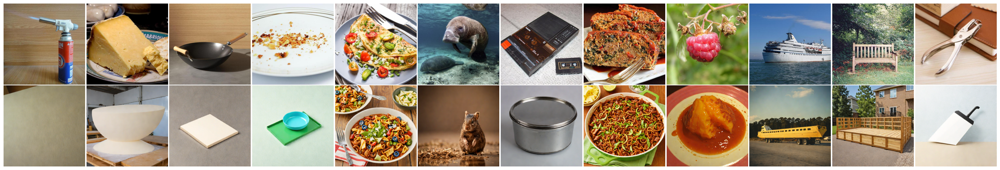

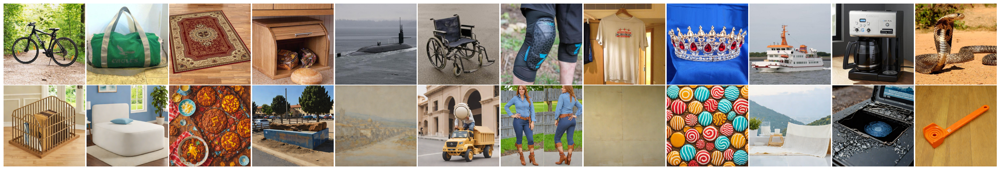

In [56]:
# Visualization calls
visualize_images(top_12, generated_folders)
visualize_images(middle_12, generated_folders)
visualize_images(bottom_12, generated_folders)